In [2]:
import pandas as pd
import glob, os
import numpy as np
import math


path = r'amplitude' # use your path
all_files = glob.glob(os.path.join(path, "*.csv"))     # advisable to use os.path.join as this makes concatenation OS independent
welllist = []
alldf = []

for fp in all_files:
    well = os.path.basename(fp)[10:13]
    alldf.append(pd.read_csv(fp).assign(Sample=well))
    welllist.append(well)
    
welllist.sort(reverse=True)
    
df = pd.concat(alldf)

df = df.reset_index(drop=True)

from natsort import natsorted

#reorder wells according to their actual order (columns)
#https://stackoverflow.com/questions/53870683/natural-sorting-in-pandas
idx, *_ = zip(*natsorted(zip(df.index, df['Sample']), key=lambda x: (x[1][:])))

#this is just so that wells are listed as A1, B1, C1 etc which will allow values from the plate reader
#to be added much more easily
df = df.iloc[list(idx)]

df = df.reset_index(drop=True)

#print(list(df.index.values))
#print(df)
print(welllist)


['H02', 'G02', 'F02', 'E02', 'D02', 'C02', 'B02', 'A02']


In [5]:
#kmeans

from sklearn.cluster import KMeans

npposcontrol = df.loc[df['Sample'] == 'D02']['Ch1 Amplitude'].values

#print(npposcontrol)

kmeans = KMeans(n_clusters=2, random_state=0).fit(npposcontrol.reshape(-1,1))

labels= kmeans.labels_
centroids = kmeans.cluster_centers_

dfkmeans = pd.DataFrame({'value': npposcontrol, 'cluster':labels})

dkpos = dfkmeans.loc[dfkmeans['cluster'] == 1]
dkneg = dfkmeans.loc[dfkmeans['cluster'] == 0]

#print(np.max(centroids))
#print(np.min(centroids))

#print(dkpos['value'].std())
#print(dkneg['value'].std())

negthreshold = np.min(centroids) + (3*dkneg['value'].std())
posthreshold = np.max(centroids) - (3*dkpos['value'].std())

print(negthreshold, posthreshold)


testdf = df.loc[df['Sample'] == 'D02']['Ch1 Amplitude']
testpos = testdf.loc[df['Ch1 Amplitude'] > posthreshold]
testneg = testdf.loc[df['Ch1 Amplitude'] < negthreshold]
testrain = testdf.loc[(df['Ch1 Amplitude'] >= negthreshold) & (df['Ch1 Amplitude'] <= posthreshold)]
#print(testpos.count(),testneg.count(), testrain.count())

print(welllist)
#print(", ".join( repr(e) for e in welllist))

2671.4022841619526 4933.441948789265
['H02', 'G02', 'F02', 'E02', 'D02', 'C02', 'B02', 'A02']


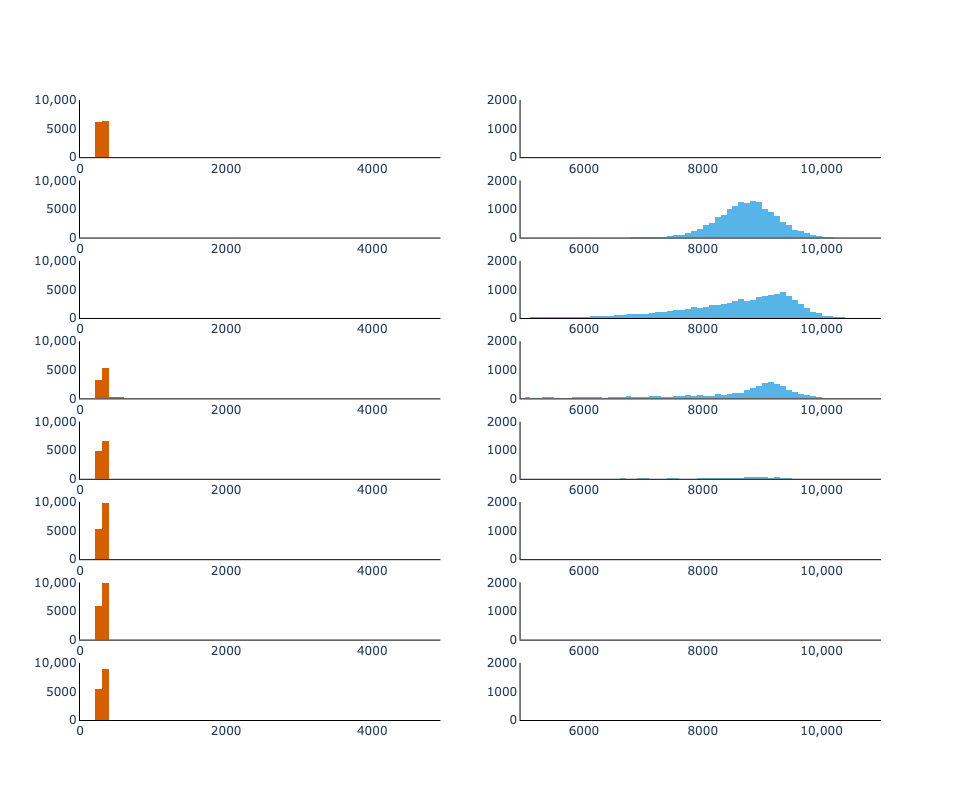

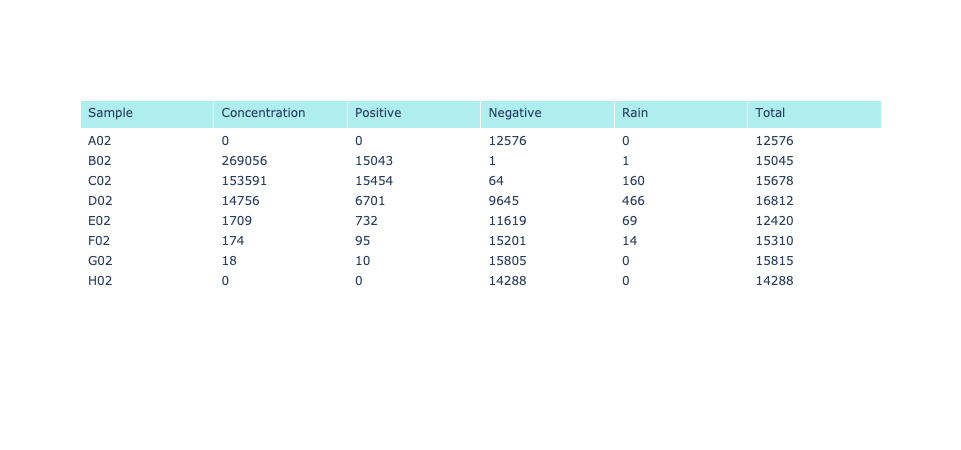

In [12]:
poissonlist = []

from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.offline as off


figpcr = make_subplots(rows=len(welllist), cols=2)
    #subplot_titles=(welllist[::-1]))
k=1

colors = ['rgba(0,0,0,1)', 'rgba(230,159,0,1)', 'rgba(86,180,233, 1)', 'rgba(0,158,115,1)','rgba(240,228,66,1)', 'rgba(0,114,178,1)', 'rgba(213,94,0, 1)', 'rgba(204,121,167,1)']


for a in welllist[::-1]:
    trace = []
    positive = df[(df['Sample'] == a) & (df['Ch1 Amplitude']>posthreshold)]['Sample']
    negative = df[(df['Sample'] == a) & (df['Ch1 Amplitude']<negthreshold)]['Sample']
    rain = df[(df['Sample'] == a) & (df['Ch1 Amplitude']>= negthreshold) & (df['Ch1 Amplitude'] <= posthreshold)]['Sample']
    p = negative.count()/(negative.count()+positive.count())
    total = negative.count()+positive.count() + rain.count()
    voldroplet = 0.715
    print()
    copynumber = round(abs(-np.log(p)/voldroplet)*1000*20)
    poissonlist.append([a,copynumber,positive.count(),negative.count(),rain.count(),total])
    pos = go.Histogram(x=df[(df['Sample'] == a) & (df['Ch1 Amplitude']>posthreshold)]['Ch1 Amplitude'],
                               xbins = dict(size=100),
                               autobinx=False,
                               name = 'Positive',
          marker_color=colors[2])
    neg = go.Histogram(x=df[(df['Sample'] == a) & (df['Ch1 Amplitude']<negthreshold)]['Ch1 Amplitude'],
                  xbins = dict(size=100),
                  autobinx=False,
                  name = 'Negative',
    marker_color=colors[6])
    trace.append(pos)
    trace.append(neg)
    figpcr.add_trace(neg,row=k, col=1)
    figpcr.add_trace(pos,row=k, col=2)
    k+=1
    
figpcr.update_layout(height=800, width=600,showlegend=False)

l = 1

while l < len(welllist)+1:
    figpcr.update_xaxes(exponentformat = 'none',range=[0, posthreshold], row=l, col=1,tick0=0, dtick=2000)#fig.update_yaxes(range=[0, 500])
    figpcr.update_xaxes(exponentformat = 'none',range=[posthreshold, 11000], row=l, col=2,tick0=0, dtick=2000)#fig.update_yaxes(range=[0, 500])
    figpcr.update_yaxes(exponentformat = 'none',range=[0, 10000], row=l, col=1,tick0=0, dtick=5000)#fig.update_yaxes(range=[0, 500])
    figpcr.update_yaxes(exponentformat = 'none',range=[0, 2000], row=l, col=2,tick0=0, dtick=1000)#fig.update_yaxes(range=[0, 500])
    l += 1

    
    
figpcr.update_layout(paper_bgcolor='rgba(255,255,255,1)',
                     plot_bgcolor='rgba(255,255,255,1)',
                 )
figpcr.update_xaxes(showline=True, linewidth=1, linecolor='black')
figpcr.update_yaxes(showline=True, linewidth=1, linecolor='black')



config = {
        'scrollZoom': False,
        'displayModeBar': False,
    }

off.iplot(figpcr, filename='cufflinks/simple-line',show_link=False, config=config)

    
outputdf = pd.DataFrame(poissonlist, columns = ["Sample", "Concentration", "Positive", "Negative", "Rain", "Total"])


fig = go.Figure(data=[go.Table(
    header=dict(values=list(outputdf.columns),
                fill_color='paleturquoise',
                align='left'),
    cells=dict(values=[outputdf.Sample, outputdf.Concentration, outputdf.Positive, outputdf.Negative, outputdf.Rain, outputdf.Total],
               fill_color='white',
               align='left'))
])

config = {
        'scrollZoom': False,
        'displayModeBar': False,
    }

off.iplot(fig, filename='cufflinks/simple-line',show_link=False, config=config)


In [15]:
fname = "output.html"
off.plot(figpcr, filename=fname, image='svg', image_filename=fname,image_width=650, image_height=800)

'output.html'

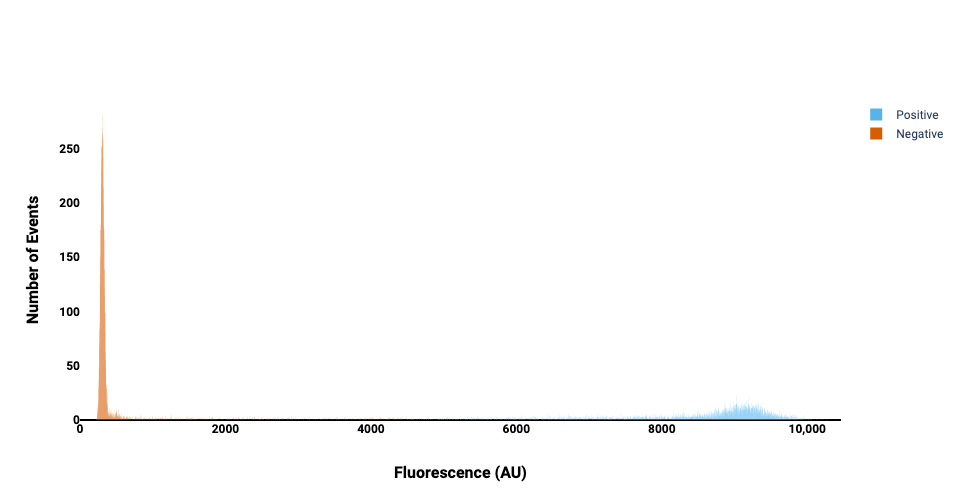

In [5]:

import numpy as np

import scipy as sp
from _plotly_future_ import v4_subplots
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.offline as off
import matplotlib
from matplotlib import cm
from matplotlib.colors import LinearSegmentedColormap
from scipy import stats

import plotly.figure_factory as ff


off.init_notebook_mode(connected=False)

#colour (CB colours from Points of view: Color blindness)

colors = ['rgba(0,0,0,1)', 'rgba(230,159,0,1)', 'rgba(86,180,233, 1)', 'rgba(0,158,115,1)','rgba(240,228,66,1)', 'rgba(0,114,178,1)', 'rgba(213,94,0, 1)', 'rgba(204,121,167,1)']

trace = []

pos = go.Histogram(x=dkpos['value'],
                                nbinsx=10000,
                               name = 'Positive',
    marker_color=colors[2])
neg = go.Histogram(x=dkneg['value'],
                   nbinsx=10000,
                  name = 'Negative',
    marker_color=colors[6])

trace.append(pos)
trace.append(neg)

layout = go.Layout(
    paper_bgcolor='rgba(255,255,255,1)',
    plot_bgcolor='rgba(255,255,255,1)',
    font=dict(family='Roboto'),
    
    autosize = False,
    width=1000,
    height=500,
    hovermode='closest',
    xaxis=dict(
        title='<b>Fluorescence (AU)</b>',
        titlefont=dict(
            size=16,
            color='black'
        ),
        showticklabels=True,
        tickangle=0,
        tickfont=dict(
            size=12,
            color='black'
        ),
        tickprefix = "<b>",
        ticksuffix = "</b>",
        exponentformat = 'none',
        showexponent = 'all',
        rangemode = 'tozero',
        #zeroline = False,
        showgrid=False,
        tickwidth=0,
        #range = [0,11000]
    ),
    yaxis=dict(
        title='<b>Number of Events</b>',
        titlefont=dict(
            size=16,
            color='black',
            
        ),
        showticklabels=True,
        tickangle=0,
        tickfont=dict(
            size=12,
            color='black'
        ),
        exponentformat = 'none',
        showgrid=False,
        zerolinecolor='#000',
        zerolinewidth=2,
        showexponent = 'all',
        tickprefix = "<b>",
        ticksuffix = "</b>",
        rangemode='tozero',
        tickwidth=2,
        position=0
    )
)

figure=go.Figure(data = trace, layout = layout)



# Overlay both histograms
#figure.update


#config can be used to remove the modebar at the top of each graph

config = {
    'scrollZoom': False,
    'displayModeBar': False,
}

#show_link=False removes the export to plotly line from graphs

off.iplot(figure, filename='cufflinks/simple-line',show_link=False, config=config)


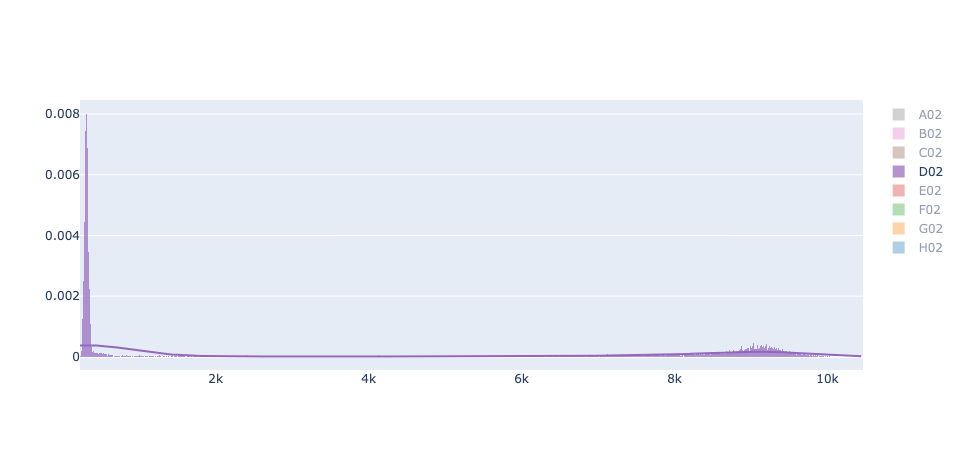

In [81]:
import numpy as np

import scipy as sp
from _plotly_future_ import v4_subplots
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import plotly.offline as off
import matplotlib
from matplotlib import cm
from matplotlib.colors import LinearSegmentedColormap
from scipy import stats

import plotly.figure_factory as ff


off.init_notebook_mode(connected=False)

#colour (CB colours from Points of view: Color blindness)

colors = ['rgba(0,0,0,1)', 'rgba(230,159,0,1)', 'rgba(86,180,233, 1)', 'rgba(0,158,115,1)','rgba(240,228,66,1)', 'rgba(0,114,178,1)', 'rgba(213,94,0, 1)', 'rgba(204,121,167,1)']

layout = go.Layout(
    font=dict(family='Roboto'),
    
    autosize = False,
    width=1000,
    height=500,
    hovermode='closest',
    xaxis=dict(
        title='<b>Concentration (ng/&mu;l)</b>',
        titlefont=dict(
            size=16,
            color='black'
        ),
        showticklabels=True,
        tickangle=0,
        tickfont=dict(
            size=12,
            color='black'
        ),
        tickprefix = "<b>",
        ticksuffix = "</b>",
        zeroline = False,
        showgrid=False,
        tickwidth=0,
        range = [0,11000]
    ),
    yaxis=dict(
        title='<b>Fluorescence (AU)</b>',
        titlefont=dict(
            size=16,
            color='black',
            
        ),
        showticklabels=True,
        tickangle=0,
        tickfont=dict(
            size=12,
            color='black'
        ),
        showgrid=False,
        zerolinecolor='#000',
        zerolinewidth=2,
        exponentformat='power',
        tickprefix = "<b>",
        ticksuffix = "</b>",
        rangemode='tozero',
        tickwidth=2,
        position=0
    )
)

figure=go.Figure(layout = layout)

hist_data = []
group_labels = []

for a in welllist:
    hist_data.append(df.loc[df['Sample'] == a]['Ch1 Amplitude']) 
    group_labels.append(a)
    


# Create distplot with custom bin_size
fig = ff.create_distplot(hist_data, group_labels, bin_size=10, show_rug=False)

#fig = px.histogram(df, x='Ch1 Amplitude', color="Sample", marginal="rug", # can be `box`, `violin`
#                  )
# Overlay both histograms
#figure.update(barmode='overlay')


#config can be used to remove the modebar at the top of each graph

config = {
    'scrollZoom': False,
    'displayModeBar': False,
}

#show_link=False removes the export to plotly line from graphs

off.iplot(fig, filename='cufflinks/simple-line',show_link=False, config=config)

#py.offline.iplot({‘data’: data, ‘layout’: layout}, filename=‘plot_name’, image=‘png’)

#off.iplot({'data': data}, filename='plot_name', image='png')